In [2]:
import cv2
import h5py
import numpy as np
import time

import sklearn.feature_extraction
from skimage import feature
from skimage.filters import roberts, sobel, scharr, prewitt
import networkx as nx


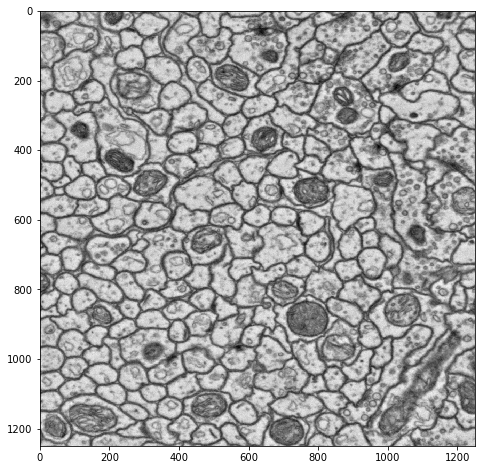

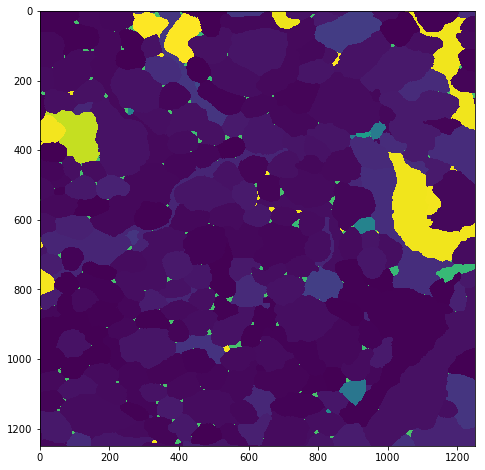

In [2]:
import h5py
import numpy as np

with h5py.File("Data/sample_A.hdf", "r") as hdf:
    raw_data = hdf['volumes']['raw'][:]
    labels = hdf['volumes']['labels']['neuron_ids'][:]
    
plt.figure(figsize=(12,8))
plt.imshow(raw_data[1,:,:], cmap="gray")

plt.figure(figsize=(12,8))
plt.imshow(labels[1,:,:])

In [52]:
labels[0,:,:]

array([[  885,  2064,  2064, ..., 24500, 24500, 24500],
       [ 2064,  2064,  2064, ..., 24500, 24500, 24500],
       [ 2064,  2064,  2064, ..., 24500, 24500, 24500],
       ..., 
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935],
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935],
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935]], dtype=uint64)

In [15]:
matrix = sklearn.feature_extraction.img_to_graph(labels[0,:,:])
graph = nx.from_scipy_sparse_matrix(matrix)
graph.remove_edges_from(graph.selfloop_edges())

In [16]:
graph.number_of_edges()

3122500

In [21]:
start = time.time()

for i, edge in enumerate(graph.edges_iter()):
    if i == 10:
        break
    print edge
    

end = time.time()

print end - start

(0, 1)
(0, 1250)
(1, 2)
(1, 1251)
(2, 3)
(2, 1252)
(3, 4)
(3, 1253)
(4, 5)
(4, 1254)
2.56719899178


In [54]:
img = labels[0,:,:]

In [55]:
img

array([[  885,  2064,  2064, ..., 24500, 24500, 24500],
       [ 2064,  2064,  2064, ..., 24500, 24500, 24500],
       [ 2064,  2064,  2064, ..., 24500, 24500, 24500],
       ..., 
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935],
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935],
       [ 6036,  6036,  6036, ..., 19935, 19935, 19935]], dtype=uint64)

In [33]:
img = img.astype(np.uint8)

In [34]:
img

array([[117,  16,  16, ..., 180, 180, 180],
       [ 16,  16,  16, ..., 180, 180, 180],
       [ 16,  16,  16, ..., 180, 180, 180],
       ..., 
       [148, 148, 148, ..., 223, 223, 223],
       [148, 148, 148, ..., 223, 223, 223],
       [148, 148, 148, ..., 223, 223, 223]], dtype=uint8)

In [42]:
edge_sobel = sobel(img)
edge_scharr = scharr(img)
edge_prewitt = prewitt(img)

In [50]:
edges1 = feature.canny(img, sigma=0)

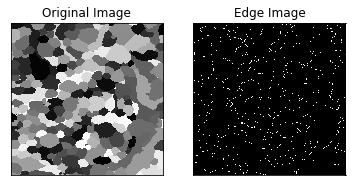

In [16]:


edges = cv2.Canny(img,100, 200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

In [40]:
edge_prewitt[np.where(edge_prewitt > 0)] = 255

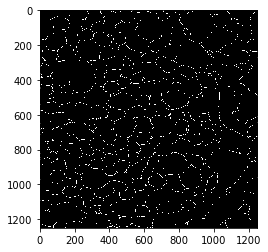

In [51]:
plt.imshow(edges1,cmap = 'gray')

In [174]:
img[0,1] = 15
img[5,1] = 15
img[0,5] = 15
img[7,3] = 15

In [175]:
img = np.expand_dims(img, axis=2)

In [176]:
n_x = img.shape[0]
n_y = img.shape[1]
n_z = 1

vertices = np.arange(n_x * n_y * n_z).reshape((n_x, n_y, n_z))
edges_deep = np.vstack((vertices[:, :, :-1].ravel(),
                            vertices[:, :, 1:].ravel()))
edges_right = np.vstack((vertices[:, :-1].ravel(),
                         vertices[:, 1:].ravel()))
edges_down = np.vstack((vertices[:-1].ravel(), vertices[1:].ravel()))
edges = np.hstack((edges_deep, edges_right, edges_down))

In [177]:
n_x, n_y, n_z = img.shape
gradient = np.abs(img[edges[0] // (n_y * n_z),
                      (edges[0] % (n_y * n_z)) // n_z,
                      (edges[0] % (n_y * n_z)) % n_z] -
                      img[edges[1] // (n_y * n_z),
                      (edges[1] % (n_y * n_z)) // n_z,
                      (edges[1] % (n_y * n_z)) % n_z])

In [162]:
img.shape

(10, 10, 1)

In [163]:
gradient.shape

(180,)

In [167]:
gradient[np.where(gradient > 0)]

array([ 870, 2049, 1179, 2049], dtype=int16)

In [168]:
(gradient > 0).shape

(180,)

In [166]:
img.flatten().shape

(100,)

In [183]:
gradient

array([ 870, 2049,    0,    0, 2049, 2049,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0, 2049, 2049,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0, 2049,
       2049,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0, 1179, 2049,    0,    0,    0, 2049,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0, 2049,
          0,    0,    0,    0,    0,    0,    0,    0,    0, 2049,    0,
          0,    0,    0,    0,    0,    0,    0,   

In [179]:
img[:,:,0]

array([[ 885,   15, 2064, 2064, 2064,   15, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064,   15, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064,   15, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064],
       [2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064, 2064]], dtype=int16)

In [180]:
np.argwhere(gradient > 0)

array([[  0],
       [  1],
       [  4],
       [  5],
       [ 45],
       [ 46],
       [ 65],
       [ 66],
       [ 90],
       [ 91],
       [ 95],
       [131],
       [141],
       [153],
       [163]])

In [182]:
163 % 100

63

In [11]:
import cv2
import re
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [24]:
# Set image size
image_tl = (0, 0)
image_size = (512, 512)
window_size = (15, 15)

#import Images
img = cv2.imread('1O.jpg', 0)
gt = cv2.imread('1G.jpg', 0)

#resize
img = img[image_tl[0]:image_tl[0] + image_size[0],
          image_tl[1]:image_tl[1] + image_size[1]]
gt = gt[image_tl[0]:image_tl[0] + image_size[0],
        image_tl[1]:image_tl[1] + image_size[1]]

#set type
img = img.astype(np.int16)
gt = gt.astype(np.int16)


# Import seeds
seeds = []
f = open("seeds1G.txt", 'r')
for line in f:
    y = int(float(re.split(' ', line)[0]))
    x = int(float(re.split(' ', line)[1]))
    seed = (x, y)
    
    

    if x >= image_tl[0] and x <= image_tl[0] + image_size[0]:
        if y >= image_tl[1] and y <= image_tl[1] + image_size[1]:
            x = x - image_tl[0]
            y = y - image_tl[1]
            seed = (x, y)
            seeds.append(seed)

In [25]:
seeds

[(4, 238),
 (4, 499),
 (4, 268),
 (5, 7),
 (6, 387),
 (7, 305),
 (7, 358),
 (7, 22),
 (8, 334),
 (9, 416),
 (9, 78),
 (11, 146),
 (12, 116),
 (13, 458),
 (13, 211),
 (15, 43),
 (15, 168),
 (23, 497),
 (24, 243),
 (26, 314),
 (26, 187),
 (28, 283),
 (30, 431),
 (31, 58),
 (32, 15),
 (32, 341),
 (33, 379),
 (34, 138),
 (35, 409),
 (37, 106),
 (41, 466),
 (42, 210),
 (47, 73),
 (49, 257),
 (50, 166),
 (50, 503),
 (53, 41),
 (55, 136),
 (56, 356),
 (57, 315),
 (61, 424),
 (61, 194),
 (61, 223),
 (66, 113),
 (67, 7),
 (68, 380),
 (73, 481),
 (76, 283),
 (80, 25),
 (82, 341),
 (83, 509),
 (83, 150),
 (83, 181),
 (85, 91),
 (88, 251),
 (92, 310),
 (95, 379),
 (95, 58),
 (95, 437),
 (99, 215),
 (99, 126),
 (108, 507),
 (110, 5),
 (116, 280),
 (117, 475),
 (118, 166),
 (118, 331),
 (125, 381),
 (125, 115),
 (127, 76),
 (128, 35),
 (135, 241),
 (136, 197),
 (138, 425),
 (142, 283),
 (149, 9),
 (150, 387),
 (150, 480),
 (153, 77),
 (154, 157),
 (158, 321),
 (163, 114),
 (171, 408),
 (172, 208),
 

In [26]:
len(seeds)

231

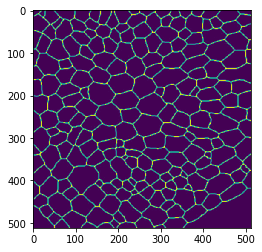

In [27]:
plt.imshow(gt)

In [28]:
for x, y in seeds:
    print x, y
    gt[x][y] = 255

4 238
4 499
4 268
5 7
6 387
7 305
7 358
7 22
8 334
9 416
9 78
11 146
12 116
13 458
13 211
15 43
15 168
23 497
24 243
26 314
26 187
28 283
30 431
31 58
32 15
32 341
33 379
34 138
35 409
37 106
41 466
42 210
47 73
49 257
50 166
50 503
53 41
55 136
56 356
57 315
61 424
61 194
61 223
66 113
67 7
68 380
73 481
76 283
80 25
82 341
83 509
83 150
83 181
85 91
88 251
92 310
95 379
95 58
95 437
99 215
99 126
108 507
110 5
116 280
117 475
118 166
118 331
125 381
125 115
127 76
128 35
135 241
136 197
138 425
142 283
149 9
150 387
150 480
153 77
154 157
158 321
163 114
171 408
172 208
176 40
179 362
180 260
181 488
182 448
183 9
188 81
191 298
192 381
194 122
197 159
198 324
199 413
211 92
212 498
212 463
213 219
220 52
221 17
222 363
223 278
227 421
229 127
243 316
243 476
245 508
245 80
246 179
247 229
250 252
257 394
258 38
258 349
259 105
262 7
266 444
266 137
271 270
276 73
277 500
282 328
285 218
285 47
288 399
289 167
293 97
297 369
299 120
300 467
303 60
303 19
307 288
312 433
313 204
314 3

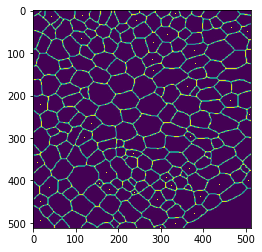

In [29]:
plt.imshow(gt)

In [30]:
from igraph import *
from sklearn.feature_extraction import image

In [35]:
matrix = image.img_to_graph(img)

In [36]:
sources, targets = matrix.nonzero()

In [37]:
weights = matrix[sources, targets]

TypeError: 'coo_matrix' object has no attribute '__getitem__'

In [39]:
def scipy_to_igraph(matrix, coords, directed=False):
    """
    convert a scipy sparse matrix to an igraph graph object
    """
    
    matrix = csr_matrix(matrix)
    sources, targets = matrix.nonzero()
    weights = matrix[sources, targets].tolist()[0]
    
    x = coords[:,0]
    y = coords[:,1]
    z = coords[:,2]
    if igraph_available:
        g = igraph.Graph(zip(sources, targets), n=matrix.shape[0], directed=directed,\
                            edge_attrs={'weight': weights},\
                            vertex_attrs={'x':x, 'y':y, 'z':z })
        return g
    else: print("igraph package not installed.")

In [40]:
scipy_to_igraph(matrix)

TypeError: scipy_to_igraph() takes at least 2 arguments (1 given)

In [45]:
from igraph import Graph
 
def scipy_to_igraph(matrix, directed=True):
    sources, targets = matrix.nonzero()
    weights = matrix.tocsr()[sources, targets]
    return Graph(zip(sources, targets), directed=directed, edge_attrs={'weight': weights})

In [47]:
G = scipy_to_igraph(matrix)

In [48]:
for v in G.vs:
    print v[]

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,0,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,1,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,2,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,4,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,5,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,6,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,7,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,9,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,10,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,11,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,12,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,14,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,15,{})
igraph.Vertex(<igraph.Graph object

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3694,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3695,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3696,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3697,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3698,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3699,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3700,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3701,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3702,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3703,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3704,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3705,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3706,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3707,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3708,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,3

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8585,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8586,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8587,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8588,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8589,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8590,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8591,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8592,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8593,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8594,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8595,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8596,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8597,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8598,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8599,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,8

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13566,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13567,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13568,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13569,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13570,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13571,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13572,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13573,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13574,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13575,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13576,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13577,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13578,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13579,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,13580,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18232,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18233,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18234,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18235,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18236,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18237,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18238,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18239,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18240,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18241,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18242,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18243,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18244,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18245,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,18246,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23073,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23074,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23075,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23076,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23077,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23078,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23079,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23080,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23081,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23082,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23083,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23084,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23085,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23086,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,23087,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27924,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27925,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27926,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27927,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27928,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27929,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27930,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27931,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27932,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27933,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27934,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27935,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27936,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27937,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,27938,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32585,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32586,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32587,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32588,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32589,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32590,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32591,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32592,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32593,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32594,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32595,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32596,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32597,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32598,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,32599,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37412,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37413,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37414,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37415,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37416,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37417,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37418,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37419,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37420,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37421,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37422,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37423,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37424,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37425,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,37426,{})
igraph.Vertex(<igraph.Graph object at 0x

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71097,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71098,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71099,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71100,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71101,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71102,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71103,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71104,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71105,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71106,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71107,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71108,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71109,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71110,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,71111,{})
igraph.Vertex(<igraph.Graph object at 0

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75595,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75596,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75597,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75598,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75599,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75600,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75601,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75602,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75603,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75604,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75605,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75606,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75607,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75608,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,75609,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80546,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80547,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80548,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80549,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80550,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80551,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80552,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80553,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80554,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80555,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80556,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80557,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80558,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80559,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,80560,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85136,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85137,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85138,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85139,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85140,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85141,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85142,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85143,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85144,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85145,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85146,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85147,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85148,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85149,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,85150,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90111,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90112,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90113,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90114,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90115,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90116,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90117,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90118,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90119,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90120,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90121,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90122,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90123,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90124,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,90125,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95038,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95039,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95040,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95041,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95042,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95043,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95044,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95045,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95046,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95047,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95048,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95049,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95050,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95051,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,95052,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99600,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99601,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99602,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99603,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99604,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99605,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99606,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99607,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99608,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99609,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99610,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99611,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99612,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99613,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,99614,{})
igraph.Vertex(<igraph.Graph object at 0x

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104565,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104566,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104567,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104568,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104569,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104570,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104571,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104572,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104573,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104574,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104575,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104576,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104577,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104578,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,104579,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109206,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109207,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109208,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109209,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109210,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109211,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109212,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109213,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109214,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109215,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109216,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109217,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109218,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109219,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,109220,{})
igraph.Vertex(<igraph.Gra

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143082,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143083,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143084,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143085,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143086,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143087,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143088,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143089,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143090,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143091,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143092,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143093,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143094,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143095,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,143096,{})
igraph.Vertex(<igraph.Gr

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148049,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148050,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148051,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148052,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148053,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148054,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148055,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148056,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148057,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148058,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148059,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148060,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148061,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148062,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,148063,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152758,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152759,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152760,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152761,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152762,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152763,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152764,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152765,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152766,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152767,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152768,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152769,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152770,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152771,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,152772,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157620,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157621,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157622,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157623,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157624,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157625,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157626,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157627,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157628,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157629,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157630,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157631,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157632,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157633,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,157634,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162565,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162566,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162567,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162568,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162569,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162570,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162571,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162572,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162573,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162574,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162575,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162576,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162577,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162578,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,162579,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167410,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167411,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167412,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167413,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167414,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167415,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167416,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167417,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167418,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167419,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167420,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167421,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167422,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167423,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,167424,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172088,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172089,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172090,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172091,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172092,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172093,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172094,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172095,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172096,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172097,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172098,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172099,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172100,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172101,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,172102,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177050,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177051,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177052,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177053,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177054,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177055,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177056,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177057,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177058,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177059,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177060,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177061,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177062,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177063,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,177064,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181824,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181825,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181826,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181827,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181828,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181829,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181830,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181831,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181832,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181833,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181834,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181835,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181836,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181837,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,181838,{})
igraph.Vertex(<igraph.Gra

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215086,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215087,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215088,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215089,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215090,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215091,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215092,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215093,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215094,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215095,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215096,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215097,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215098,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215099,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,215100,{})
igraph.Vertex(<igraph.Gr

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219935,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219936,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219937,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219938,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219939,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219940,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219941,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219942,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219943,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219944,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219945,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219946,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219947,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219948,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,219949,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224548,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224549,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224550,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224551,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224552,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224553,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224554,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224555,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224556,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224557,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224558,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224559,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224560,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224561,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,224562,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229460,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229461,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229462,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229463,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229464,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229465,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229466,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229467,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229468,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229469,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229470,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229471,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229472,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229473,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,229474,{})
igraph.Vertex(<igraph.Gra

igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234095,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234096,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234097,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234098,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234099,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234100,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234101,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234102,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234103,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234104,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234105,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234106,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234107,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234108,{})
igraph.Vertex(<igraph.Graph object at 0x7fd731029148>,234109,{})
igraph.Vertex(<igraph.Gra

KeyboardInterrupt: 

In [50]:
0.003 * 1000000

3000.0

In [53]:
512*512*2 * 0.003

1572.864

In [54]:
80000 * 0.003

240.0